In [1]:
#Data source:
#https://www.kaggle.com/c/ieee-fraud-detection/data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.manifold import TSNE
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
plt.style.use('ggplot')

<h2>Loading data</h2>

In [3]:
train = pd.read_csv('../Desktop/train_transaction.csv')
print("{} rows and {} columns".format(train.shape[0],train.shape[1]))

590540 rows and 394 columns


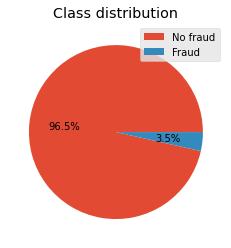

In [4]:
#Checking for class imbalance
plt.pie(train['isFraud'].value_counts(), autopct='%.1f%%')
plt.legend(['No fraud','Fraud'])
plt.title('Class distribution')
plt.show()

<h2>Preprocessing</h2>

In [5]:
#Selecting numeric features and imputing missing values
train = train.select_dtypes(include=np.number)

for col in train.columns:
    train[col] = train[col].fillna(0)

In [6]:
#Sampling for a class-balanced dataframe
fraud1 = train[train['isFraud']==1]
fraud0 = train[train['isFraud']==0].sample(n=len(fraud1))
train = fraud1.append(fraud0).sample(frac=0.2) #Fraction optional

In [14]:
#Finding important features with Gradient boosting
features = train.drop('isFraud', axis=1)
target = train['isFraud']

gbc = GradientBoostingClassifier()
gbc.fit(features, target)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [15]:
#Top features dataframe
top_features = pd.DataFrame(list(zip(list(features.columns), gbc.feature_importances_)), columns = ['feature','importance']).sort_values('importance', ascending = False).reset_index(drop = True).head(15)

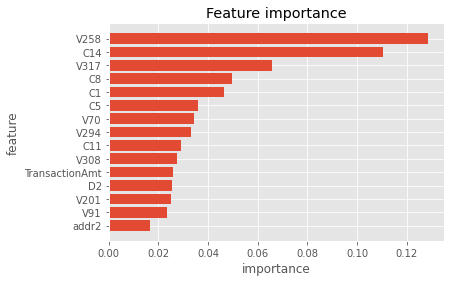

In [16]:
#Plotting top features
x = 'feature'
y = 'importance'
fig, ax = plt.subplots()
plt.barh(top_features[x],top_features[y])
plt.title('Feature importance')
plt.xlabel(y)
plt.ylabel(x)
ax.invert_yaxis()

<h2>Plotting t-SNE</h2>

In [19]:
#Looping through number of features
for n in range(2,12):  
    #Optional sample for faster iterations
    sample = 5000 
    features = train[top_features['feature'].head(n).unique()].head(sample)
    target = train['isFraud'].head(sample)
   
    #Dimensionality reduction to 2 components
    tsne = TSNE(n_components=2, init='random', random_state=0)
    result2d = tsne.fit_transform(features)
    
    #Cross validating with a SVC
    features2d = pd.DataFrame(result2d)
    cv = cross_val_score(SVC(), features2d, target, cv=10, scoring = 'f1')
    f1 = round(np.mean(cv),2)
   
    fig = px.scatter(pd.DataFrame(result2d), x=0, y=1, color=target)
    fig.update_layout(
        width = 600,
        height = 400,
        title = str(n) + ' features: SVC F1 score=' + str(f1),
        title_x = 0.5,
        xaxis_title="t-SNE1",
        yaxis_title="t-SNE2")
    fig.show()
    

<p>Interesting results: Fraud transactions (yellow) and non-fraud transactions (blue) seem to be seperated quite well, given that the input file contained 394 features and only generic processing was applied without prior knowledge. All features were put through a GradientBoostingClassifier for pre-selection and t-SNE for dimensionality reduction. However, t-SNE is only a tool for vizualising high dimensional data and can't be used to reduce dimensions prior to training a classifier because different initializations can get different results.

More info: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html</p>


In [20]:
#Just for fun: using 3 component t-SNE for a 3D plot

#Optional sample for faster iterations
sample = 5000 

#Using top 9 features
features = train[top_features['feature'].head(9).unique()].head(sample)
target = train['isFraud'].head(sample)

#Dimensionality reduction to 3 components
tsne = TSNE(n_components=3, init='random', random_state=0)
result3d = tsne.fit_transform(features)

#Cross validating with a SVC
features2d = pd.DataFrame(result3d)
cv = cross_val_score(SVC(), result3d, target, cv=10, scoring = 'f1')
f1 = round(np.mean(cv),2)

fig = px.scatter_3d(pd.DataFrame(result3d), x=0, y=1, z=2, color=target)
fig.update_layout(
    width = 600,
    height = 600,
    title = '9 features visualized in 3 dimensions with t-SNE: SVC F1 score=' + str(f1),
    title_x = 0.5,
    xaxis_title="t-SNE1",
    yaxis_title="t-SNE2")
fig.show()